In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader 
from torch.autograd import Variable
from torch.backends import cudnn


import matplotlib.pyplot as plt
import os
from PIL import Image
import cv2
import numpy as np


# Augmenting library 

import torchvision
import torchvision.transforms.functional as TF
import albumentations as A
import torchvision.transforms as T

# Control Randomness
import random
random_seed = 7
torch.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)
random.seed(random_seed)

import warnings
warnings.filterwarnings("ignore")
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "3"
print(torch.cuda.device_count())


# logging
import datetime
from tensorboardX import SummaryWriter
from tqdm import tqdm
import time 

/home/sklab2/anaconda3/envs/vessel2/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


1


In [2]:
import joint_transforms
from config import cod_training_root
from config import backbone_path
from datasets import ImageFolder
from misc import AvgMeter, check_mkdir
from PFNet import PFNet
from helper import *
import loss

# Config

In [3]:
ckpt_path = './ckpt'
exp_name = 'PFNet'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
args = {
    'epoch_num': 200,
    'train_batch_size': 32,
    'last_epoch': 0,
    'lr': 1e-4, 
    'lr_decay': 0.9,
    'weight_decay': 5e-4,
    'momentum': 0.9,
    'snapshot': '',
    'scale': 416, 
    'save_point': [],
    'poly_train': False,
    'optimizer': 'Adam',
    'amp' : False
}

In [4]:
# loss function
structure_loss = loss.structure_loss().to(device)
bce_loss = nn.BCEWithLogitsLoss().to(device)
iou_loss = loss.IOU().to(device)

In [5]:
def bce_iou_loss(pred, target):
    bce_out = bce_loss(pred, target)
    iou_out = iou_loss(pred, target)
    loss = bce_out + iou_out
    return loss



# Net

In [6]:
net = PFNet(backbone_path)

From ./backbone/resnet/resnet50-19c8e357.pth Load resnet50 Weights Succeed!


In [7]:
from torch.optim.lr_scheduler import ReduceLROnPlateau



if args['optimizer'] == 'SGD':
    print('SGD opt')
    optimizer = torch.optim.SGD([
        {'params': [param for name, param in net.named_parameters() if name[-4:] == 'bias'],
        'lr': 2 * args['lr']},
        {'params': [param for name, param in net.named_parameters() if name[-4:] != 'bias'],
        'lr': 1 * args['lr'], 'weight_decay': args['weight_decay']}
    ], momentum=args['momentum'])

else:
    print('Adam opt')
    optimizer = torch.optim.Adam([
        {'params': [param for name, param in net.named_parameters() if name[-4:] == 'bias'],
            'lr': 2 * args['lr']},
        {'params': [param for name, param in net.named_parameters() if name[-4:] != 'bias'],
            'lr': 1 * args['lr'], 'weight_decay': args['weight_decay']}
    ])

# scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=20, \
#                                 threshold=0.05, threshold_mode='rel', cooldown=5, min_lr = 1e-4)

# scheduler = CosineAnnealingWarmupRestarts(optimizer, first_cycle_steps=200, cycle_mult=1.0, max_lr=0.1, min_lr=0.001, warmup_steps=50, gamma=0.5)

Adam opt


## making data index list

In [8]:
mask_files = os.walk("/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/masked")
mask_idx = []
for (root, dirs, files) in mask_files:
    if len(files) > 0 :
        mask_idx.append(files)

mask_idxs = [element for array in mask_idx for element in array]
len(mask_idxs)

1691

In [9]:
# 1~ 11 / 12, 13, 14  , 40, 41, 43, 44, 46, 49,  50, 53, 54, 55 
train_indexs = []
test_indexs = []
for idx, data in enumerate(mask_idxs):
    tmp = mask_idxs[idx].split('_')
    if len(tmp) < 3:
        if int(tmp[0]) < 45:
            train_indexs.append([ tmp[0], tmp[1].split('.')[0]])
        else:
            test_indexs.append([tmp[0], tmp[1].split('.')[0]])

In [10]:
len(train_indexs) , len(test_indexs)

(1319, 355)

# Dataloader

In [11]:
import albumentations.augmentations.functional as AF

PATH = '/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/'
class VesselDataset(Dataset):
    def __init__(self, index, transforms):
        self.index = index
        self.transforms = transforms
        
    def __len__(self):
        return len(self.index)
        
    def __getitem__(self, idx):
        s_1 = self.index[idx][0]
        s_2 = self.index[idx][1]

        # '1_L_0.jpg', 
        image = Image.open(PATH+'origin/' + s_1+'_L_'+s_2+'.jpg').convert("L").resize((416, 416),Image.Resampling.BILINEAR)
        #'10_L_112_L.png', 
        mask = Image.open(PATH+'masked/' +  s_1+'_'+s_2+'.png').resize((416, 416),Image.Resampling.BILINEAR)
        
        image = np.array(image, dtype=np.uint8) #RGB
        mask = np.array(mask, dtype=np.uint8)   # HWC
        mask_o = mask / 255        # CHW

        lower_red = np.array([-10, 100, 100]) 
        upper_red = np.array([10, 255, 255]) 

        mask_hsv = cv2.cvtColor(mask, cv2.COLOR_RGB2HSV)
        mask = cv2.inRange(mask_hsv, lower_red, upper_red)

        aft_mask = mask / 255
        
        # aft_mask = cv2.resize(aft_mask, (416, 416), interpolation=cv2.INTER_NEAREST)
        masks = [aft_mask, mask_o]  # target, original

        # for num in range(3): #### 3번 이터레이션이 왜들어갔지?
        if self.transforms:
            transformed = self.transforms(image=image, masks=masks)
            image, masks = transformed['image'], transformed['masks']
        # urls.append(s_1+'_'+s_2)
        assert sum(masks[0]==0).sum() + sum(masks[0]==1).sum() == 416*416   # mask가 0 또는 1이 아닐경우 스탑
                    
        return image, masks, aft_mask, s_1+'_'+s_2

In [12]:
import albumentations.pytorch as AP

prob = 0.5

train_transforms = A.Compose([      
    # A.RandomRotate90(p=prob),
    # A.HorizontalFlip(p=prob),

    # A.OneOf([
    #     A.OpticalDistortion(),
    #     A.GridDistortion(),
    #     A.ElasticTransform(),
    #     ], p = 0.3),
    # A.OneOf([
    #     A.CLAHE(clip_limit = 2),
    #     A.RandomBrightnessContrast(),
    #     ], p = 0.3),

    # A.Equalize(p=1.0),
    # A.CLAHE(always_apply=True), # 위에 추가하고 
    #transforms.RandomCrop((420, 420)) , 
    #transforms.RandomVerticalFlip(p=1), 
    # A.Normalize(mean=(126.8661, 126.8530, 127.0134), std = (32.9434, 33.0122, 32.9186)),
    AP.ToTensorV2(always_apply=True)
])

test_transforms = A.Compose([
    AP.ToTensorV2(always_apply=True)
])

train_dataset = VesselDataset(index=train_indexs, transforms=train_transforms)
test_dataset = VesselDataset(index=test_indexs, transforms=test_transforms)
 
#train_dataset, _, test_dataset = torch.utils.data.random_split(dataset, [train, 0, test])

train_loader = DataLoader(dataset=train_dataset, batch_size=args['train_batch_size'], shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

image, masks, aft_mask, _= next(iter(train_loader))
print(image.shape, masks[0].shape, masks[1].shape, aft_mask.shape)

torch.Size([32, 1, 416, 416]) torch.Size([32, 416, 416]) torch.Size([32, 416, 416, 3]) torch.Size([32, 416, 416])


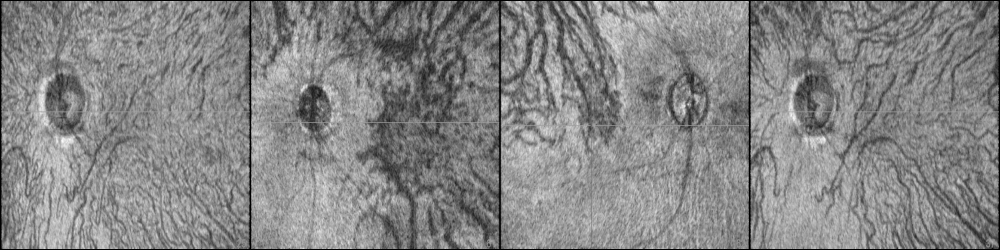

In [13]:
TF.to_pil_image(torchvision.utils.make_grid(image[:4]))

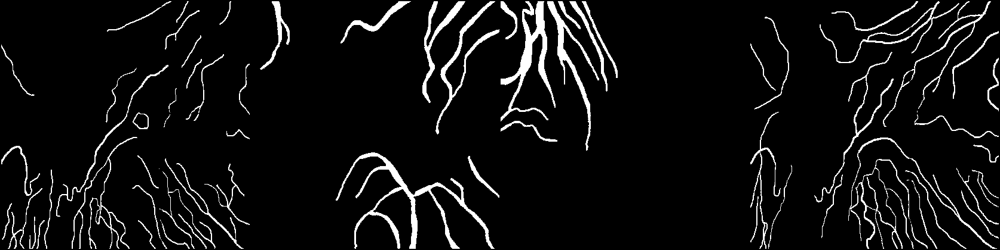

In [14]:
TF.to_pil_image(torchvision.utils.make_grid(aft_mask[:4].unsqueeze(1).expand(4, 3, 416, 416)))

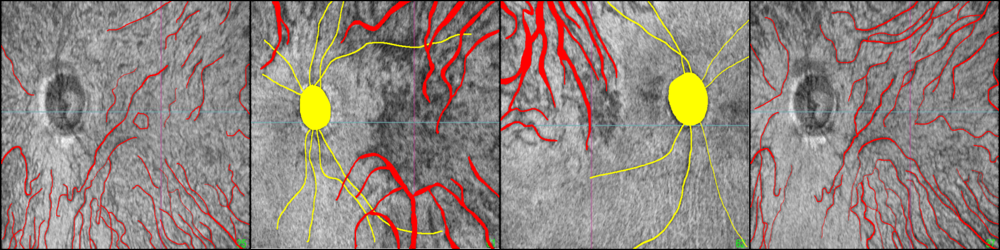

In [15]:
TF.to_pil_image(torchvision.utils.make_grid(masks[1][:4].permute(0, 3, 1, 2)))

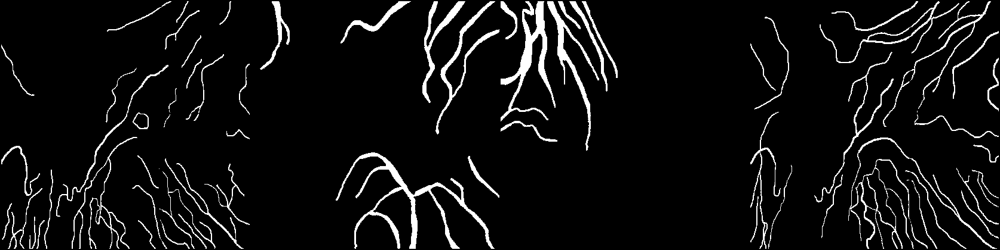

In [16]:
TF.to_pil_image(torchvision.utils.make_grid(masks[0][:4].unsqueeze(1).expand(4, 3, 416, 416)))

In [17]:
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score
def calc_metric(labels, preds):
    accuracy = np.mean(np.equal(labels,preds))
    right = np.sum(labels *preds == 1)
    precision = right / np.sum(preds)
    recall = right / np.sum(labels)
    f1 = 2 * precision*recall/(precision+recall)

    
    y_pred = preds
    y_true = labels
    """ Ground truth """
    #y_true = y_true.cpu().numpy()
    y_true = y_true > 0.5
    y_true = y_true.astype(np.uint8)
    y_true = y_true.reshape(-1)

    """ Prediction """
    #y_pred = y_pred.cpu().numpy()
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(np.uint8)
    y_pred = y_pred.reshape(-1)

    score_jaccard = jaccard_score(y_true, y_pred)
    score_f1 = f1_score(y_true, y_pred)
    score_recall = recall_score(y_true, y_pred)
    score_precision = precision_score(y_true, y_pred)
    score_acc = accuracy_score(y_true, y_pred)
    print('jaccard, f1, recall, precision, acc')
    print(score_jaccard, score_f1, score_recall, score_precision, score_acc)
    return score_jaccard, score_f1, score_recall, score_precision, score_acc

# Train

Using 2 GPUs.
base_ch1_b32_e200_js_221001_10:15
../model/vessel_PFNet_base_ch1_b32_e200_221001_10:15.pt
Training 200 epochs.


100%|██████████| 42/42 [02:04<00:00,  2.95s/it, Epoch=0, Loss=6.907634, Mean Loss=8.715325, lr=0.000200] 


Testing...
jaccard, f1, recall, precision, acc
0.2733472792234096 0.4293365740571872 0.35201235362926364 0.5501940552423465 0.9149432374572881
Model Saved


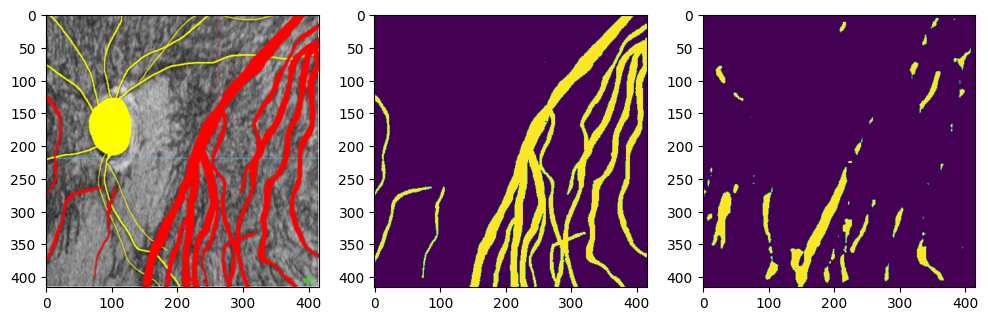

100%|██████████| 42/42 [01:26<00:00,  2.05s/it, Epoch=5, Loss=5.904409, Mean Loss=5.448362, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.38700778141351017 0.5580470226621332 0.5403933806437841 0.5768930403637681 0.9221991969382866
Model Saved


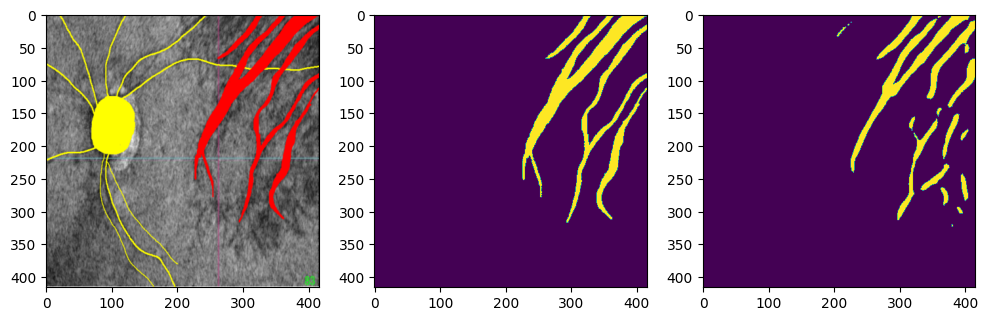

100%|██████████| 42/42 [01:27<00:00,  2.07s/it, Epoch=10, Loss=5.074429, Mean Loss=4.657880, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.3805203876811247 0.5512709425759209 0.5479654046805685 0.5546166030558218 0.9189149063203184
Model Saved


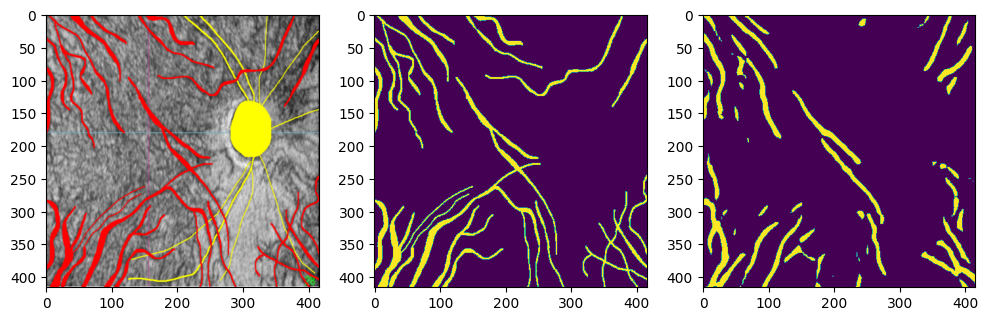

100%|██████████| 42/42 [01:26<00:00,  2.06s/it, Epoch=15, Loss=4.192228, Mean Loss=4.203440, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.3541398926184597 0.5230477213601173 0.4652488812895453 0.5972446744533763 0.9228763204225352


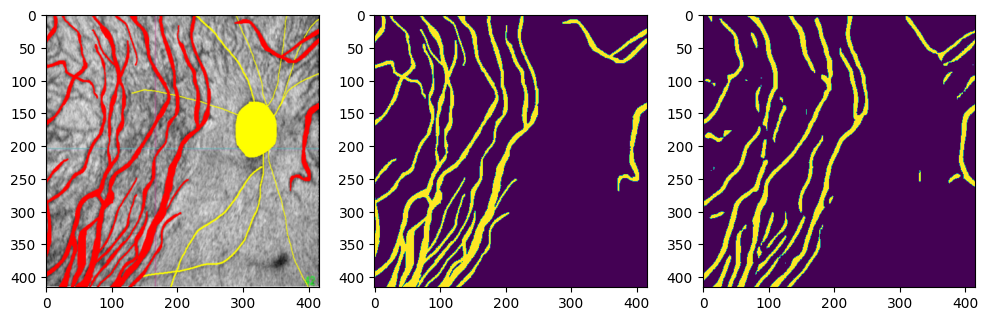

100%|██████████| 42/42 [01:27<00:00,  2.07s/it, Epoch=20, Loss=3.616004, Mean Loss=3.897064, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.33035316500671136 0.49663980016170334 0.41443073808744385 0.6195345271102876 0.9236413744114093


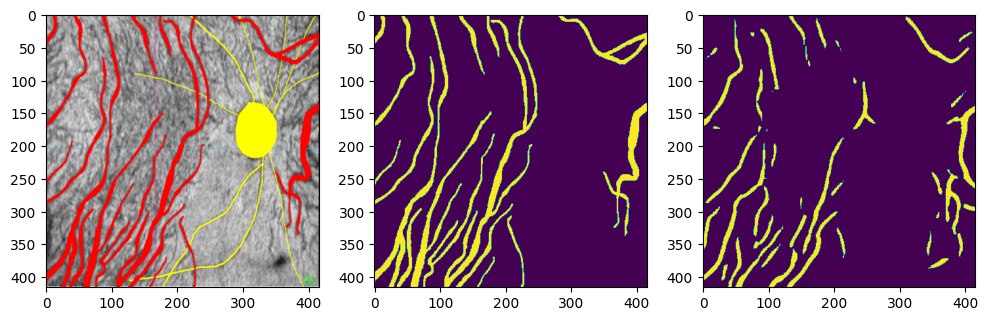

100%|██████████| 42/42 [01:26<00:00,  2.06s/it, Epoch=25, Loss=4.395167, Mean Loss=3.745926, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.32521036468459635 0.49080564618432826 0.41432723006073663 0.6019087103249553 0.921857680848404


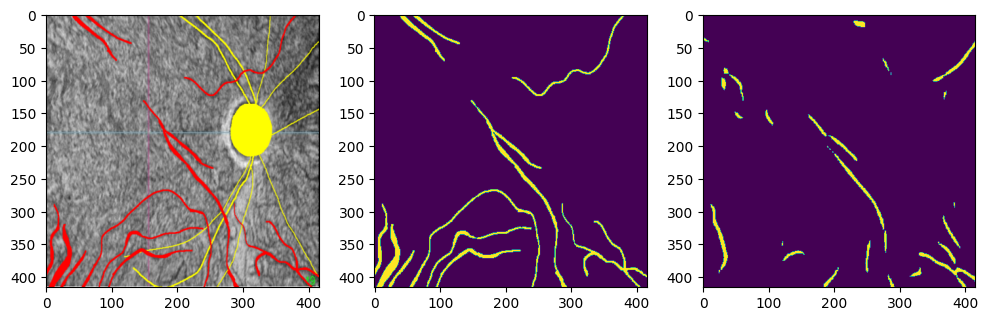

100%|██████████| 42/42 [01:27<00:00,  2.08s/it, Epoch=30, Loss=3.183094, Mean Loss=3.579563, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.34183860636857255 0.5095077824503691 0.44988420711060745 0.587349801808761 0.9212680809338278


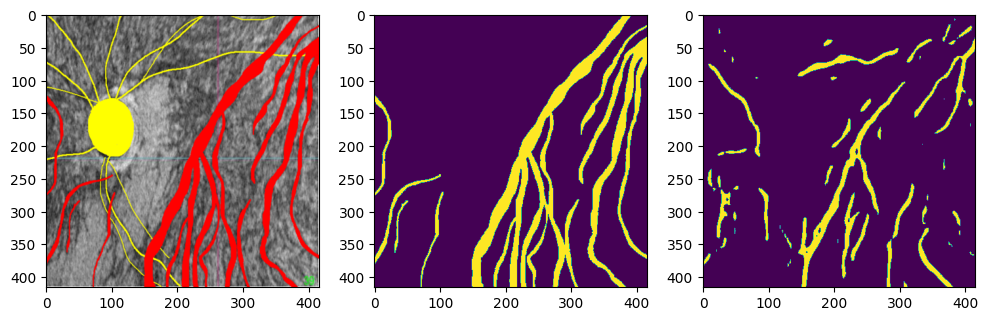

100%|██████████| 42/42 [01:26<00:00,  2.07s/it, Epoch=35, Loss=3.101066, Mean Loss=3.465550, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.3305367367368189 0.4968472160302317 0.432778520759269 0.5831816467384707 0.9203269380521294


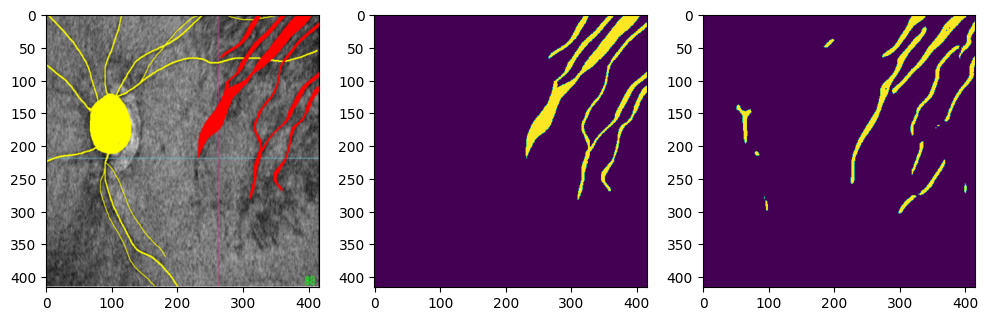

100%|██████████| 42/42 [01:26<00:00,  2.06s/it, Epoch=40, Loss=4.205352, Mean Loss=3.391812, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.34255708467993456 0.5103054292273914 0.4431404263671118 0.6014674134176985 0.9226954134198683


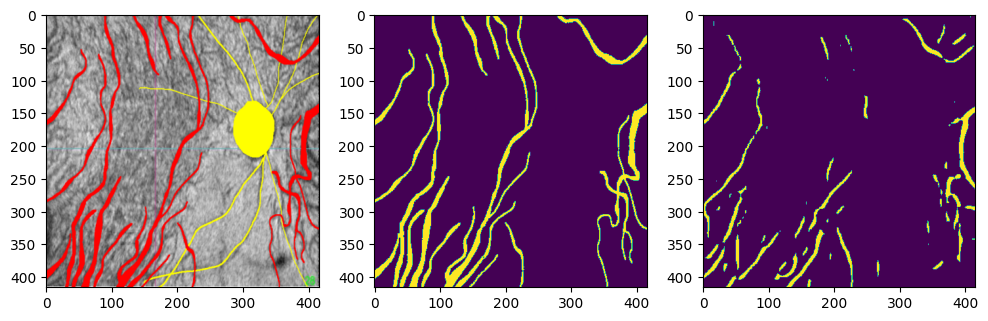

100%|██████████| 42/42 [01:26<00:00,  2.05s/it, Epoch=45, Loss=3.702867, Mean Loss=3.303093, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.3531468775398439 0.5219638509337585 0.4713828958895494 0.5847046026179009 0.9215192900189599


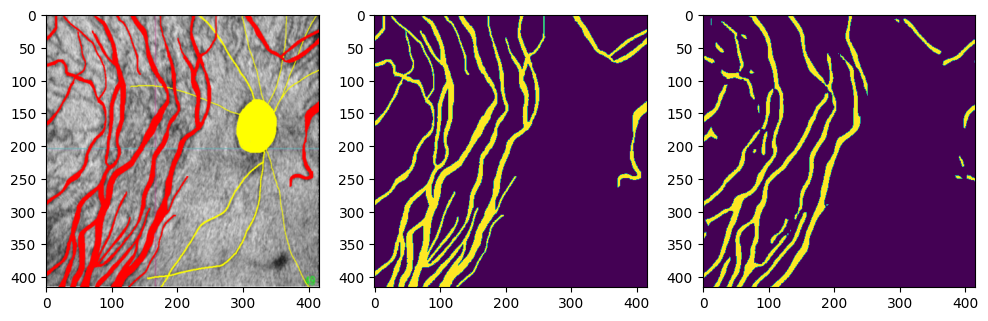

100%|██████████| 42/42 [01:26<00:00,  2.06s/it, Epoch=50, Loss=2.896698, Mean Loss=3.226821, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.3283246532080617 0.49434398799287316 0.4198994718583523 0.6008736480263478 0.9219199581735978


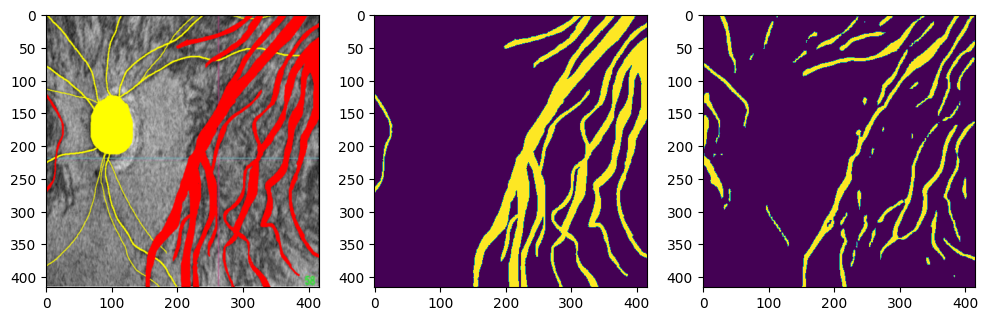

100%|██████████| 42/42 [01:26<00:00,  2.05s/it, Epoch=55, Loss=3.530144, Mean Loss=3.213352, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.3300889645903656 0.49634118224869994 0.427737429147144 0.5911550919217147 0.921095426572006


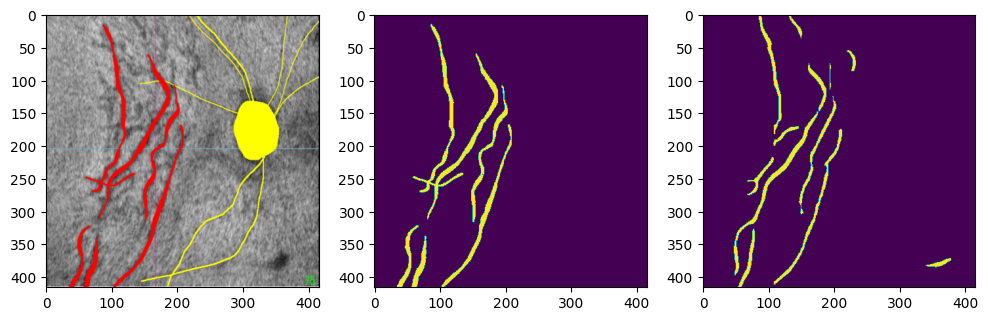

100%|██████████| 42/42 [01:27<00:00,  2.07s/it, Epoch=60, Loss=3.052173, Mean Loss=3.148508, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.35066322914958314 0.5192459846121241 0.5008361227970519 0.5390609233869794 0.9157025943568214


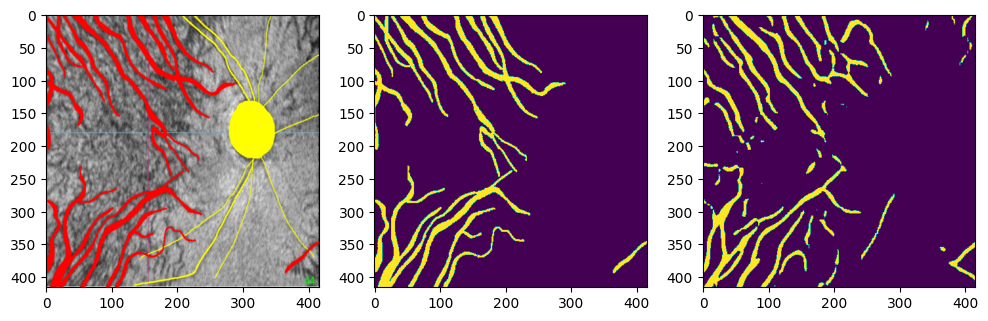

100%|██████████| 42/42 [01:27<00:00,  2.07s/it, Epoch=65, Loss=3.727220, Mean Loss=3.113355, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.3418962767510139 0.5095718390080191 0.4488602297806561 0.589275655342659 0.9214674139511626


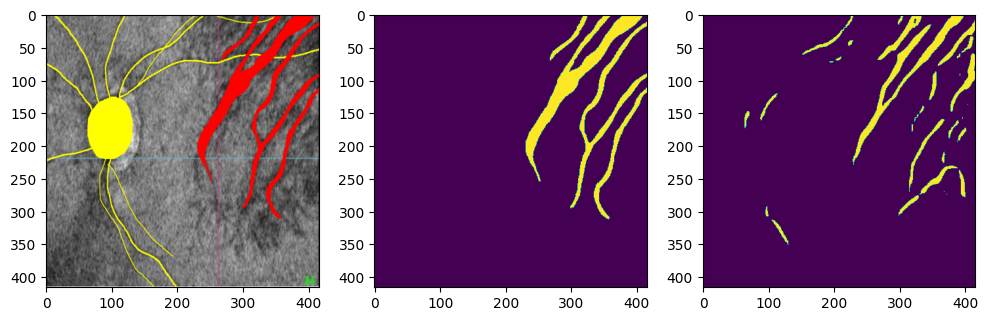

100%|██████████| 42/42 [01:26<00:00,  2.06s/it, Epoch=70, Loss=2.664663, Mean Loss=3.059135, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.34032259988288965 0.5078219227410257 0.4394302545724402 0.6014261722759638 0.9225770767355613


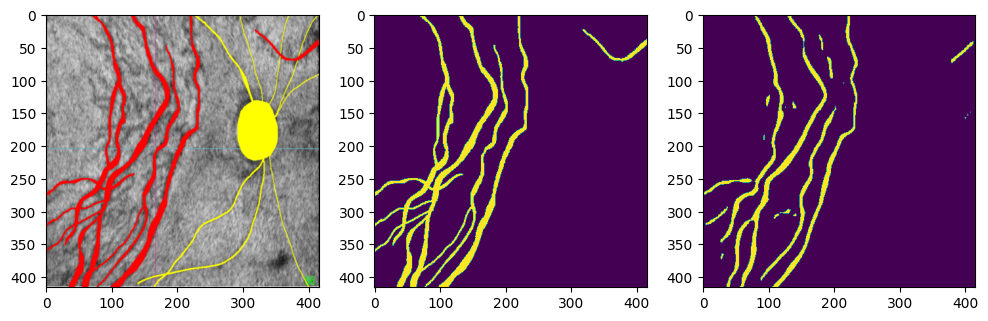

100%|██████████| 42/42 [01:26<00:00,  2.06s/it, Epoch=75, Loss=3.419086, Mean Loss=3.056920, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.34406616202663154 0.5119780138022911 0.4590455628723513 0.5787088094744107 0.9204550411753063


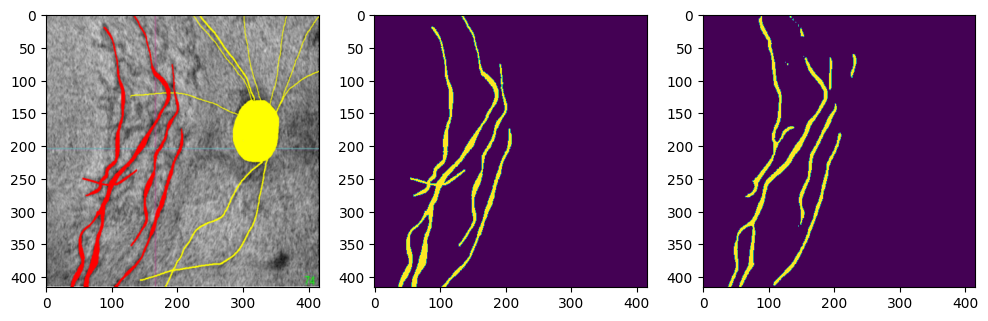

100%|██████████| 42/42 [01:26<00:00,  2.07s/it, Epoch=80, Loss=3.162920, Mean Loss=3.046603, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.33037722722365914 0.49666699108059387 0.4199293781567262 0.6077216350862407 0.9226366682900659


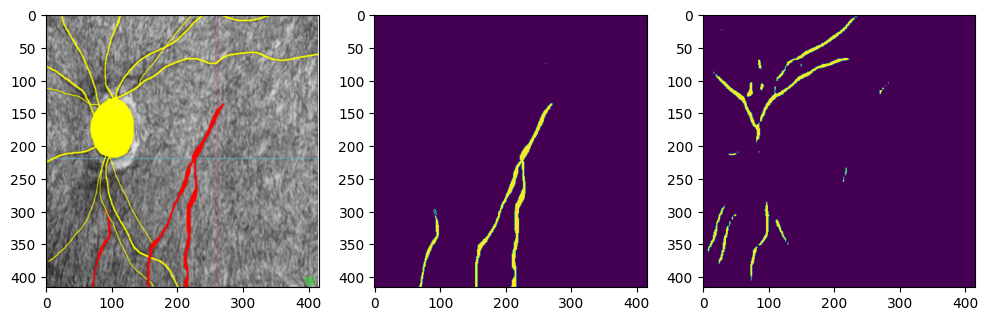

100%|██████████| 42/42 [01:26<00:00,  2.07s/it, Epoch=85, Loss=2.951103, Mean Loss=3.014630, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.3474056162661532 0.5156659762616428 0.46535668722739604 0.5781715810619917 0.9205431670087091


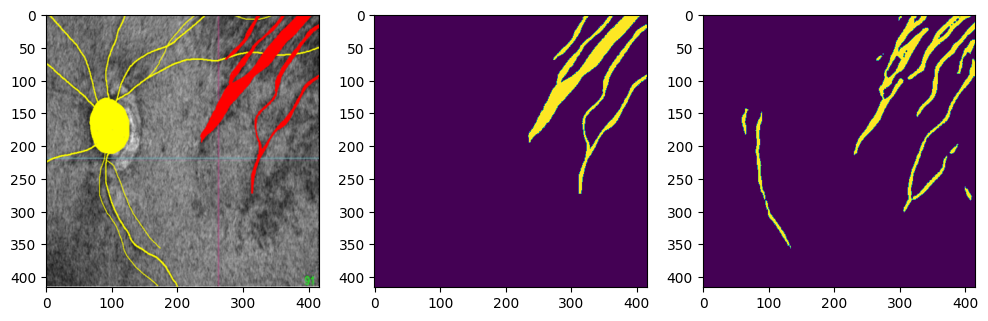

100%|██████████| 42/42 [01:26<00:00,  2.05s/it, Epoch=90, Loss=3.245241, Mean Loss=2.976225, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.3350866026965958 0.5019698377914825 0.4472751959668402 0.5719046835068267 0.9193282220132928


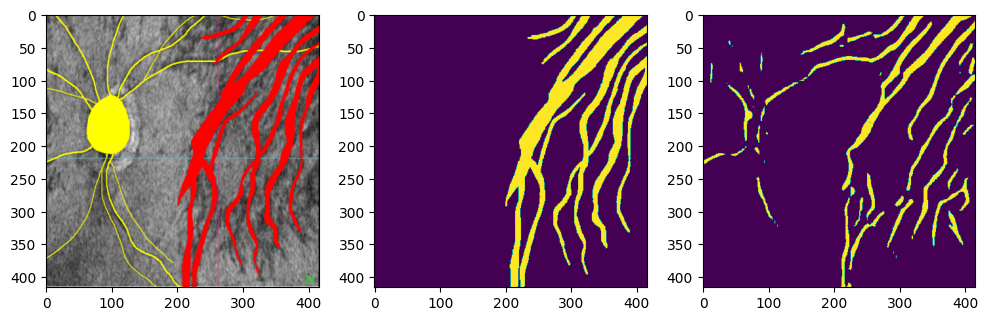

100%|██████████| 42/42 [01:26<00:00,  2.06s/it, Epoch=95, Loss=2.848983, Mean Loss=2.940239, lr=0.000200]


Testing...
jaccard, f1, recall, precision, acc
0.32769111203145534 0.49362552639230406 0.4131764643520505 0.612977615584446 0.9229489501729311


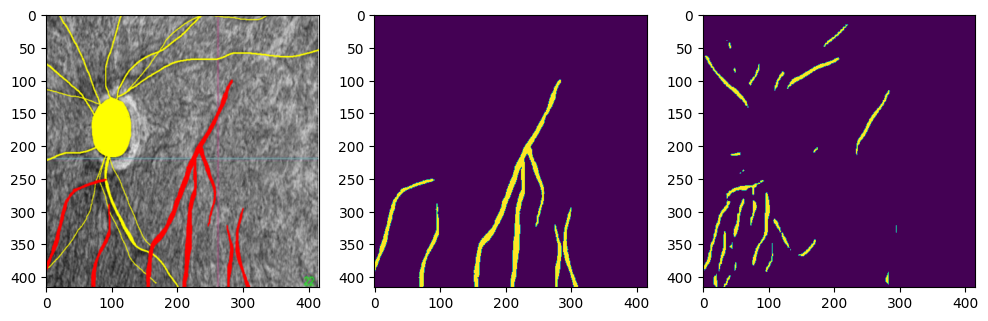

 64%|██████▍   | 27/42 [00:56<00:31,  2.11s/it, Epoch=98, Loss=3.008053, Mean Loss=2.964971, lr=0.000200]


KeyboardInterrupt: 

In [18]:
from tensorboardX import SummaryWriter
import datetime 

exp = 'base_ch1'

num_epochs = args['epoch_num']
resume_epochs = args['last_epoch']
# load_from = '../model/vessel_PFNet_base_b32_e500_220921_00:30.pt'


batch_size = args['train_batch_size']
scaler = torch.cuda.amp.GradScaler()
now = datetime.datetime.now()
log_name = f'{exp}_b{batch_size}_e{num_epochs}_js_'+now.strftime("%y%m%d_%H:%M")
writer = SummaryWriter(log_dir='./ckpt/PFNet/log/'+ log_name)
save_path = f'../model/vessel_PFNet_{exp}_b{batch_size}_e{num_epochs}_'+ now.strftime("%y%m%d_%H:%M") + '.pt'


print(f'Using {torch.cuda.device_count()} GPUs.')
net = nn.DataParallel(net)

# net.float()
net = net.to(device)
train_loss_list = []
test_acc_list = []
test_recall_list = []
test_f1_list = []
test_iou_list = []
print(log_name)
print(save_path)
print(f'Training {num_epochs} epochs.')
if resume_epochs != 0:
    print(f'Resuming from epoch {resume_epochs}')
    net.load_state_dict(torch.load(load_from))
if args['amp'] == True:
    print("Using mixed precision.")

# print(data.shape, aug_masks[0].shape, aug_masks[1].shape, aft_mask.shape)
curr_iter = 1

for epoch in range(args['last_epoch'], args['last_epoch'] + args['epoch_num']):
    
    net.train()

    loss_1_running, loss_2_running, loss_3_running, loss_4_running, loss_running = 0, 0, 0, 0, 0
    tqdm_dataset = tqdm(train_loader)
    for batch_idx, batch in enumerate(tqdm_dataset):
        if args['poly_train']:
            base_lr = args['lr'] * (1 - float(curr_iter) / float(num_epochs)) ** args['lr_decay']
            optimizer.param_groups[0]['lr'] = 2 * base_lr
            optimizer.param_groups[1]['lr'] = 1 * base_lr

        image, masks, aft_mask, _ = batch
        labels = masks[0]
        labels = labels.unsqueeze(1)
        image, labels = image.float().to(device), labels.float().to(device)
        optimizer.zero_grad()

        # mixed precision
        if args['amp'] == True:
            with torch.cuda.amp.autocast():

                predict_1, predict_2, predict_3, predict_4 = net(image)
                
                loss_1 = bce_iou_loss(predict_1, labels)
                loss_2 = structure_loss(predict_2, labels)
                loss_3 = structure_loss(predict_3, labels)
                loss_4 = structure_loss(predict_4, labels)
                loss = 1 * loss_1 + 1 * loss_2 + 2 * loss_3 + 4 * loss_4

            scaler.scale(loss).backward()
            # nn.utils.clip_grad_norm_(net.parameters(), max_norm=10)
            scaler.step(optimizer)
            scaler.update()

        else:
            predict_1, predict_2, predict_3, predict_4 = net(image)

            loss_1 = bce_iou_loss(predict_1, labels)
            loss_2 = structure_loss(predict_2, labels)
            loss_3 = structure_loss(predict_3, labels)
            loss_4 = structure_loss(predict_4, labels)
            loss = 1 * loss_1 + 1 * loss_2 + 2 * loss_3 + 4 * loss_4
            
            loss.backward()
            # nn.utils.clip_grad_norm_(net.parameters(), max_norm=10)
            optimizer.step()
        
        loss_1_running += loss_1.item()
        loss_2_running += loss_2.item()
        loss_3_running += loss_3.item()
        loss_4_running += loss_4.item()
        loss_running += loss.item()
        
        tqdm_dataset.set_postfix({
            'Epoch': epoch,
            'Loss': '{:06f}'.format(loss.item()),
            'Mean Loss' : '{:06f}'.format(loss_running/(batch_idx+1)),
            'lr' : '{:06f}'.format(optimizer.param_groups[0]["lr"])
        })

        curr_iter += 1

    epoch_loss = loss_running / len(train_loader)
    epoch_loss_1 = loss_1_running / len(train_loader)
    epoch_loss_2 = loss_2_running / len(train_loader)
    epoch_loss_3 = loss_3_running / len(train_loader)
    epoch_loss_4 = loss_4_running / len(train_loader)

    # scheduler.step()

    writer.add_scalar('loss/Train', epoch_loss, epoch)
    writer.add_scalar('learning_rate', optimizer.param_groups[0]["lr"], epoch)
    train_loss_list.append(epoch_loss)

## EVAL
    if epoch % 5 == 0 or epoch == args['epoch_num']-1 :
        print("Testing...")

        images=[]
        preds=[]
        labels=[]
        label_os = []
        urls_list = []
        net.eval()
        # tqdm_loader = tqdm(test_loader)
        with torch.no_grad():
            for idx, dd in enumerate(test_loader):

                image, masks, mask_o, urls = dd 
                
                image = image.float().to(device)
                label = masks[0].float()
                label_o = masks[1].float()
                _, _, _, pred = net(image)    

                images.append(image.cpu().detach().numpy())
                labels.append(label.numpy())
                label_os.append(label_o)
                preds.append(pred.cpu().detach().numpy())
                urls_list.append(urls)

            images= np.array(images).squeeze(1)
            preds = np.array(preds).squeeze(1)
            labels = np.array(labels)
            label_os = np.array(label_os)
            preds = np.where(preds > 0.5 , 1 , 0)
            labels = np.where(labels > 0.5 , 1 , 0)
            
            score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)
            test_acc_list.append(score_acc)
            test_recall_list.append(score_recall)
            test_f1_list.append(score_f1)
            writer.add_scalar('Accuracy/Test', score_acc, epoch)
            writer.add_scalar('F1/Test', score_f1, epoch)
            writer.add_scalar('Recall/Test', score_recall, epoch)
            writer.add_scalar('Precision/Test', score_precision, epoch)
            writer.add_scalar('Jaccard/Test', score_jaccard, epoch)

            if np.max(test_f1_list) == test_f1_list[-1] or np.max(test_recall_list) == test_recall_list[-1]:
                torch.save(net.state_dict(), save_path)
                print("Model Saved")

            randnum = np.random.randint(0, 171)
            plt.figure(figsize=(10, 4))
            plt.subplot(1, 3, 1)  
            plt.imshow(label_os[randnum][0])
            plt.subplot(1, 3, 2)  
            plt.imshow(labels[randnum][0])
            plt.subplot(1, 3, 3)
            plt.imshow(preds[randnum][0])
            plt.tight_layout()
            plt.show()

# evaluation

In [20]:
print("Testing...")
net = PFNet(backbone_path)
load_from = '/home/sklab2/workspace/code_only/junsu/model/vessel_PFNet_base_ch1_b32_e200_221001_10:15.pt'
if torch.cuda.device_count() > 1:
    print(f'Using {torch.cuda.device_count()} GPUs.')
    net = nn.DataParallel(net)
net.load_state_dict(torch.load(load_from))
net.to(device)

images=[]
preds=[]
labels=[]
label_os = []
urls_list = []
net.eval()
# tqdm_loader = tqdm(test_loader)
with torch.no_grad():
    for idx, dd in enumerate(tqdm(test_loader)):

        image, masks, mask_o, urls = dd 
        
        image = image.float().to(device)
        label = masks[0].float()
        label_o = masks[1].float()
        _, _, _, pred = net(image)    

        images.append(image.cpu().detach().numpy())
        labels.append(label.numpy())
        label_os.append(label_o)
        preds.append(pred.cpu().detach().numpy())
        urls_list.append(urls)

    images= np.array(images).squeeze(1)
    preds = np.array(preds).squeeze(1)
    labels = np.array(labels)
    label_os = np.array(label_os)
    preds = np.where(preds > 0.5 , 1 , 0)
    labels = np.where(labels > 0.5 , 1 , 0)
    
    score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)

Testing...
From ./backbone/resnet/resnet50-19c8e357.pth Load resnet50 Weights Succeed!
Using 2 GPUs.


100%|██████████| 355/355 [00:43<00:00,  8.21it/s]


jaccard, f1, recall, precision, acc
0.3805203876811247 0.5512709425759209 0.5479654046805685 0.5546166030558218 0.9189149063203184


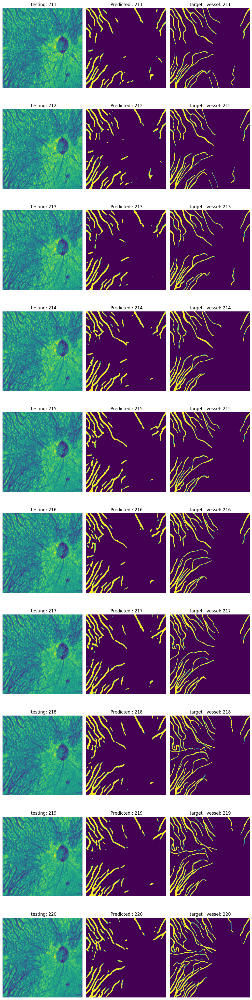

In [21]:
# randnum = np.random.randint(0, len(test_dataset)-10)
randnum=211

fig, axes = plt.subplots(10, 3, figsize = (10,40))
[c_ax.axis('off') for c_ax in axes.flatten()]

for idx, (img_ax, target_ax , mask_ax ) in zip(range(randnum, randnum+10), axes):
    
# inputs[:10] , preds[:10], targets[:10], urls_list[:10]) :
    
    image = images[idx].astype(int).transpose(1, 2, 0) # astype(int)
    img_target = preds[idx].transpose(1, 2, 0) 
    img_mask = labels[idx].transpose(1, 2, 0)  
 
    img_ax.imshow(np.clip(image, 0, 255))

    target_ax.imshow(img_target )
    mask_ax.imshow(img_mask)

    img_ax.set_title(f'  testing: {idx}')
    target_ax.set_title(f' Predicted : {idx}')
    
    mask_ax.set_title(f' target   vessel: {idx}')
plt.tight_layout()
plt.show()
 
 